# Description

In this project we will be classifying Zoological star of a person based on his blog posts. Blog posts are fetched from different websites and are related to different topics. 

# Data

Data is in the form of XML files. Each person's data is enclosed in a separate XML file. We will be extracting following parameters from an XML file:
- Person ID
- Age
- Gender
- List of posts with dates
- Star of the person



In [1]:
import pandas as pd
import os
from lxml import html
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import os
from lxml import html
# Packages

import pandas as pd
import numpy as np
import string
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import spacy
from collections import Counter
import tensorflow as tf


# Visualisation

import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
#import PIL
#from scipy.misc import imread
from imageio import imread



# Model Building

    #classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier

    #vectorizers
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

import numpy as np



    #training features
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.model_selection import GridSearchCV

    #performance measures
from sklearn.metrics import accuracy_score,log_loss
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import make_scorer

    #filter future warnings
#two futre warnings occured multiple times when running cross validation and GridSearchCV have been removed
#FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
#FutureWarning: The default value of cv will change from 3 to 5 in version 0.22
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize, sent_tokenize, TreebankWordTokenizer
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler

In [4]:
# Deep learning
from keras.preprocessing.text import text_to_word_sequence
import pandas as pd
from keras.preprocessing.text import Tokenizer


from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers import Conv1D, GlobalMaxPooling1D
from keras.layers import Input, Dropout, Dense, Activation, concatenate,  Embedding, Flatten
from keras.models import Model
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras import backend as K
from keras.layers import SpatialDropout1D
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer

In [5]:
import tarfile
with tarfile.open('/content/drive/My Drive/blogs_train.tar.xz', 'r:xz') as tar:
    tar.extractall()

In [6]:
data_folder=r'/content/blogs_train'
xml_file_list = os.listdir(data_folder)


In [7]:
main_dict={}
i=0
for ii,json_file in enumerate(xml_file_list):
    path=data_folder+'/'+json_file
    title_list=os.path.split(path)[1].split('.')
    with open(path,encoding='cp437') as f:
        xml_data = f.read()
    contents=html.fromstring(xml_data)
    list_=[]
    print('#################### '+str(ii)+'############################')
    for tags in contents:
        if tags.tag=='date':
            date=tags.text
        elif tags.tag=='post' :
            list_.append([date,tags.text])
    for value in list_:
        main_dict[i]={
        
        'Gender':title_list[1],
        'Age':title_list[2],
        'Topic':title_list[3],
        'Star':title_list[4],
        
        'Date':value[0],
         'Posts':value[1],
        
        }
        i+=1


Streaming output truncated to the last 5000 lines.
#################### 9601############################
#################### 9602############################
#################### 9603############################
#################### 9604############################
#################### 9605############################
#################### 9606############################
#################### 9607############################
#################### 9608############################
#################### 9609############################
#################### 9610############################
#################### 9611############################
#################### 9612############################
#################### 9613############################
#################### 9614############################
#################### 9615############################
#################### 9616############################
#################### 9617############################
#################### 9618######

# Loading data into a Dataframe
We will create a dataframe and will load all data from XML files into that dataframe to make our further processing easy. 

In [8]:
df = pd.DataFrame.from_dict(main_dict, "index")
print(df)

        Gender  ...                                              Posts
0       female  ...  \n\n\t\t\t\t\t\t\n\t\t\t\t\t\t     Nasi Goreng...
1       female  ...  \n\n\t\t\t\t\t\t\n\t\t\t\t\t\t       My birthd...
2       female  ...  \n\n\t\t\t\t\t\t\n\t\t\t\t\t\t   Photo blog te...
3       female  ...  \n\n\t\t\t\t\t\t\n\t\t\t\t\t\t     I cut my fi...
4       female  ...  \n\n\t\t\t\t\t\t\n\t\t\t\t\t\t   Just a few ar...
...        ...  ...                                                ...
615487  female  ...  \n\n\t \n      This is the journal nobody I kn...
615488  female  ...  \n\n\t \n      I'm Claudine. This is my blog. ...
615489  female  ...  \n\n\t \n      I get to have lunch with the Co...
615490  female  ...  \n\n\t \n      So I just got home from work......
615491  female  ...  \n\n\t \n      So I decided to start another o...

[615492 rows x 6 columns]


In [9]:
df.Posts=df.Posts.iloc[:].str.strip()


# Data Visualization and Analysis
This is the most important part of any data science project. With the analysis we get in this part, we decide values of different hyper-parements in algorithm part of the project

In [10]:
df.head()

,Gender,Age,Topic,Star,Date,Posts
0,female,24,Science,Gemini,"30,May,2004",Nasi Goreng ala Marilyn... doesn't taste as go...
1,female,24,Science,Gemini,"29,May,2004",My birthday chocolates!
2,female,24,Science,Gemini,"19,May,2004",Photo blog test run
3,female,24,Science,Gemini,"07,June,2004",I cut my finger while analysing expired gas in...
4,female,24,Science,Gemini,"06,June,2004",Just a few artwork from Loughborough College f...


In [11]:
df.describe()

,Gender,Age,Topic,Star,Date,Posts
count,615492,615492,615492,615492,615492,615492
unique,2,26,40,12,2598,552656
top,male,17,indUnk,Aries,"02,August,2004",
freq,312892,73361,226843,59942,14648,2853


Above table shows that we have a total of two gender values, forty unique topic values and twelve stars. 

In [12]:
print('Number of rows and columns in train data:{}' .format(df.shape))

Number of rows and columns in train data:(615492, 6)


In [13]:
df.isnull().sum()

Gender    0
Age       0
Topic     0
Star      0
Date      0
Posts     0
dtype: int64

Class distribution is very important aspect of a classification problem. If data in unbiased, we will need to use different metrics and algorithms to handle the issue of biasness. 

In [14]:
type_sum = df.groupby(['Star']).count()


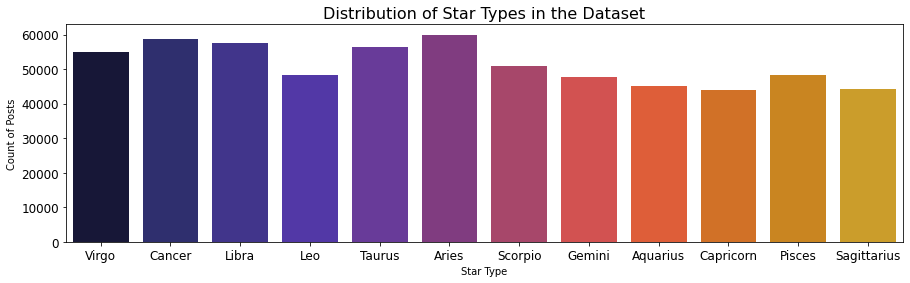

In [15]:
dim = (15.0, 4.0)
fig, ax = plt.subplots(figsize=dim)
cmrmap = sns.color_palette('CMRmap', 16)
sns.set_palette(cmrmap)
sns.countplot(x='Star', data=df,
              order=['Virgo', 'Cancer', 'Libra', 'Leo', 'Taurus', 'Aries', 'Scorpio',
                     'Gemini', 'Aquarius', 'Capricorn', 'Pisces', 'Sagittarius'])
plt.title('Distribution of Star Types in the Dataset', fontsize=16)
plt.xlabel('Star Type')
plt.ylabel('Count of Posts')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

We can observe from above figure that data is not biased. 

In [16]:
df['word_count'] = df['Posts'].apply(lambda x: len(str(x).split(" ")))
word_count = df.groupby('Star').sum()
word_count.sort_values('word_count', ascending=False, inplace=True)
word_count

,word_count
Star,
Cancer,12794707
Libra,12006380
Virgo,11989184
Aries,11674135
Taurus,11501010
Leo,10923813
Gemini,10419388
Scorpio,10294112
Aquarius,10085594


Let's count the total number of words in each post and while doing this we are also remove spaces in start and end of sequence. It will help us to set the sequence length in padding later. 

In [17]:
df['totalwords'] = df['Posts'].str.split().str.len()

In [18]:
df.head()

,Gender,Age,Topic,Star,Date,Posts,word_count,totalwords
0,female,24,Science,Gemini,"30,May,2004",Nasi Goreng ala Marilyn... doesn't taste as go...,36,30
1,female,24,Science,Gemini,"29,May,2004",My birthday chocolates!,3,3
2,female,24,Science,Gemini,"19,May,2004",Photo blog test run,4,4
3,female,24,Science,Gemini,"07,June,2004",I cut my finger while analysing expired gas in...,11,11
4,female,24,Science,Gemini,"06,June,2004",Just a few artwork from Loughborough College f...,21,13


In [19]:
df.describe()

,word_count,totalwords
count,615492.000000,615492.000000
mean,211.367907,199.201715
std,435.339495,414.697238
min,1.000000,0.000000
25%,40.000000,37.000000
50%,118.000000,110.000000
75%,268.000000,253.000000
max,134544.000000,131176.000000


We can drop rows where total number of words are less than two in a post.

In [20]:
df.drop(df[df['totalwords'] < 2].index, inplace = True) 

In [21]:
df.describe()

,word_count,totalwords
count,608714.000000,608714.000000
mean,213.710343,201.413368
std,437.187053,416.466737
min,1.000000,2.000000
25%,42.000000,38.000000
50%,120.000000,113.000000
75%,270.000000,256.000000
max,134544.000000,131176.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc24c03d0b8>]],
      dtype=object)

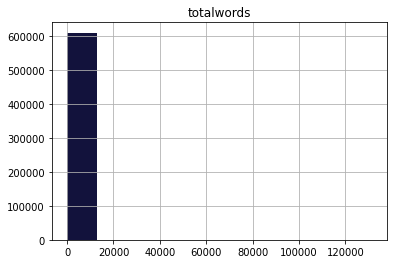

In [22]:
df.hist(column=['totalwords'])

In [23]:
#drop word_count column
df = df.drop(['word_count','totalwords'], axis=1)

# WordCloud
Using wordcloud, we can see the occurance of most frequent words by each Zodiac Star.

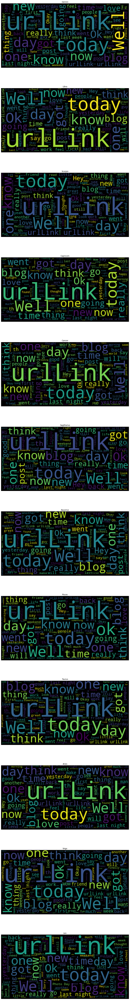

In [24]:


fig, ax = plt.subplots(len(df['Star'].unique()), sharex=True, figsize=(15,10*len(df['Star'].unique())))

k = 0
for i in df['Star'].unique():
    df_4 = df[df['Star'] == i]
    wordcloud = WordCloud().generate(df_4['Posts'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(i)
    ax[k].axis("off")
    k+=1

It can be seen that most prominent word in all Stars is 'urlLink', so its better to remove it because it is imparting no meaningful information in the sequence.

In [25]:
df['Posts'] = df['Posts'].str.replace('urlLink', '')

Now we can visualize wordcloud again.

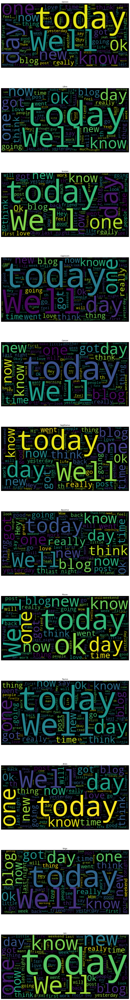

In [26]:
fig, ax = plt.subplots(len(df['Star'].unique()), sharex=True, figsize=(15,10*len(df['Star'].unique())))

k = 0
for i in df['Star'].unique():
    df_4 = df[df['Star'] == i]
    wordcloud = WordCloud().generate(df_4['Posts'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(i)
    ax[k].axis("off")
    k+=1

# Data Preprocessing
Data preprocessing is the most important part of any machine learning problem. Abberant nature of data can lead to disastrous results. Hence cleaning of data and transforming it to appropriate form is a mandatory task for any data science project. 

In [27]:
## Remove urls
pattern_url = r'http[s]?://(?:[A-Za-z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9A-Fa-f][0-9A-Fa-f]))+'


#apply to train set
df['Posts'] = df['Posts'].replace(to_replace = pattern_url, value='', regex = True)

In [28]:
df['Posts'] = df['Posts'].str.lower()
df['Gender'] = df['Gender'].str.lower()
df['Topic'] = df['Topic'].str.lower()
df['Star'] = df['Star'].str.lower()




In [29]:
#Remove punctuation & numbers
def remove_punctuation(post):
    punc_numbers = string.punctuation + '0123456789'
    return ''.join([l for l in post if l not in punc_numbers])

df['Posts'] = df['Posts'].apply(remove_punctuation)

In [30]:
df['Posts'][1]

'my birthday chocolates'

## Stop-words

    Stop words are the words that occur frequently in a document but does not impart any useful meaning. We need to delete such words. Now there are built-in lists of stop-words in many libraries. We are using NLTK so will be using their library of stop-words. Now some stop words are mandatory for a sentence and removing them can create problems. For examle if there is a sentence: "I do not love dogs", now if remove 'not' as stop-word, whole meaning of the sentence will be changed and will lead to terrific results. Hence we must be very careful in adding or removing stop-words in a stop-word list. 

In [31]:

nltk.download('stopwords')
# List nltk English stopwords and add 'could' and 'would'
stop_words = stopwords.words('english')
stop_words = stop_words + ['could', 'would']

# Remove selected pronouns from stopword list
stop_words = [w for w in stop_words if w not in ['not','i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', 'her', 'hers', 'herself', 'it', 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves']]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
# Define function to remove stopwords
def remove_words(df):
    
    """Remove stopwords from posts.
    Args:
        df (DataFrame): dataframe containing 'Posts' column to convert
    Returns:
        df (DataFrame): dataframe with converted 'Posts' column   
    """ 
    #text =  ' '.join([word for word in text.split() if word not in STOPWORDS]) # delete stopwords from text
    df['without_sw'] = [' '.join([word for word in text.split(' ') if word not in stop_words])for text in df['Posts']]
    
    #df['Posts'] = df['Posts'].apply(lambda row: [word for word in row if word not in stop_words])   #iterate through words in posts and eliminate stopwords
    
    return df



In [33]:
# Remove stop words from tokens
train_clean = remove_words(df.copy())

## Lemmatization

Lemmatization is the process of converting words into their base words. It helps to reduce the vocabulary size and also helps the model to converge.

In [34]:

# todo  lemmatize with POS
# Lematise posts
nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()
train_clean['lemma'] = [' '.join([lemmatizer.lemmatize(word) for word in text.split(' ')])for text in train_clean['without_sw']]




[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [35]:
train_clean.lemma[1]

'my birthday chocolate'

In [36]:
train_clean.head()

,Gender,Age,Topic,Star,Date,Posts,without_sw,lemma
0,female,24,science,gemini,"30,May,2004",nasi goreng ala marilyn doesnt taste as good a...,nasi goreng ala marilyn doesnt taste good it l...,nasi goreng ala marilyn doesnt taste good it l...
1,female,24,science,gemini,"29,May,2004",my birthday chocolates,my birthday chocolates,my birthday chocolate
2,female,24,science,gemini,"19,May,2004",photo blog test run,photo blog test run,photo blog test run
3,female,24,science,gemini,"07,June,2004",i cut my finger while analysing expired gas in...,i cut my finger analysing expired gas lab,i cut my finger analysing expired gas lab
4,female,24,science,gemini,"06,June,2004",just a few artwork from loughborough college f...,artwork loughborough college finalists liver...,artwork loughborough college finalist liverp...


In [37]:
#import pickle
#train_clean.to_pickle("clean_df.pkl")
#train_clean = pd.read_pickle("clean_df.pkl")

In [38]:
#check number of words after cleaning
words_len = train_clean['lemma'].str.split().str.len()

In [39]:
words_len.describe()

count    608714.000000
mean        124.390219
std         252.575355
min           0.000000
25%          24.000000
50%          70.000000
75%         158.000000
max       75210.000000
Name: lemma, dtype: float64

We can see that after cleaning average number of words in a sequence is 125, 75% of data have 158 words.

## Conversion of text into vectors

In [40]:
oov_tok = "unknown_text"
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 100000
# Max number of words in each post.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100
tokenizer = Tokenizer(num_words=MAX_NB_WORDS, oov_token=oov_tok)
tokenizer.fit_on_texts(train_clean['lemma'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))


Found 1267009 unique tokens.


In [41]:
trunc_type='post'
padding_type='post'



x_posts = tokenizer.texts_to_sequences(train_clean['lemma'].values)
x_posts = pad_sequences(x_posts, maxlen=MAX_SEQUENCE_LENGTH, padding=padding_type, truncating=trunc_type)


print(x_posts[0])
print(x_posts.shape)

[17438 26608  2499  8600   155   990    29     3    73     4    58   714
  5589  3391    93    52    63  3804  1357  4490   680     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0   

## Encoding Categorical variables

In [42]:
import scipy
x_dummies = scipy.sparse.csr_matrix(pd.get_dummies(df[["Gender", "Topic"]], sparse = True).values)

## Stacking all features 

In [44]:
train_clean['Age'] = train_clean['Age'].astype(int)
x_age=np.array(train_clean[["Age"]])

In [45]:
#x_age=np.array(train_clean[["Age"]])
X = scipy.sparse.hstack((x_dummies,x_posts,x_age)).tocsr().toarray()


In [46]:
X.shape

(608714, 293)

## Defining Output

In [47]:
Y = pd.get_dummies(train_clean['Star']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (608714, 12)


## Division into training and validation data

In [48]:
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.20, random_state = 42)
print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)

(486971, 293) (486971, 12)
(121743, 293) (121743, 12)



##Word embeddings

In word embeddings each word is represented by a dense vector and the words having similar meaning will have minimum difference between them. For example a 'dog' and a 'puppy' will have a value close to 1 because both are having almost similar meaning. Similarly a cat and tiger will have value close to 1 because both are animals of similar kind.

###How to choose embedding size

A word vector length will be same as of embedding size which we choose as a hyperparameter. Now if we are to choose embedding size for a POS problem where we just want to check relation of a word with different parts of speech like verb, noun etc., we can choose a smaller size because there are just 35 POS and hence a word can be represented in a smaller dimension. There is a tradeoff between of accuracy vs computational power for choosing embedding size as:

    Representaion of a word in a higher dimension (larger embedding size) increase the accuracy.
    Higher dimension representation needs more compuational power

Typically embedding size is chosen between 50 to 200.


### Memory Check
Before training the model, we need to release the memory. We can delete variables which are not needed anymore and are occupying larger space. 

In [49]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                   train_clean:  1.9 GiB
                             X:  1.3 GiB
                       x_train:  1.1 GiB
                            df: 939.1 MiB
                       x_posts: 580.5 MiB
                        x_test: 272.1 MiB
                          df_4: 78.2 MiB
                    word_index: 40.0 MiB
                     words_len: 29.3 MiB
                     main_dict: 20.0 MiB


In [50]:
del train_clean, X, df, x_posts, df_4, word_index, words_len, main_dict

# LSTM Model

In [ ]:
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=x_train.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(12, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


epochs = 5
batch_size = 128

history = model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size,validation_split=0.2,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/5
1581/3044 [==============>...............] - ETA: 30:16 - loss: 2.4145 - accuracy: 0.1500

In [ ]:
model.save("blog_trained.h5")